In [1]:
import numpy as np
import pandas as pd
import datetime
from dateutil.parser import parse
import requests, re, time
import pandas_datareader
import pickle
import math

import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches
import seaborn as sns 

import statsmodels.api as sm
import json
from pandas.io.json import json_normalize
from bs4 import BeautifulSoup
from selenium import webdriver
import time

import geopy.distance

In [2]:
Apartments = pickle.load(open('/Users/holger/Documents/Python/Harmsen_Repo/Metro-Study/Pickles/Apartment Data 4.pkl','rb'))

In [3]:
MetroList = pickle.load(open('/Users/holger/Documents/Python/Harmsen_Repo/Metro-Study/Pickles/Metrolist With Coordinates.pkl','rb'))

In [4]:
# Defining new rows of coordinates:
Apartments['latitude'] = [Apartments['Coordinates'][i][0] for i in range(0,len(Apartments))]
Apartments['longitude'] = [Apartments['Coordinates'][i][1] for i in range(0,len(Apartments))]
MetroList['latitude'] = [MetroList['Coordinates'][i][0] for i in range(0,len(MetroList))]
MetroList['longitude'] = [MetroList['Coordinates'][i][1] for i in range(0,len(MetroList))]

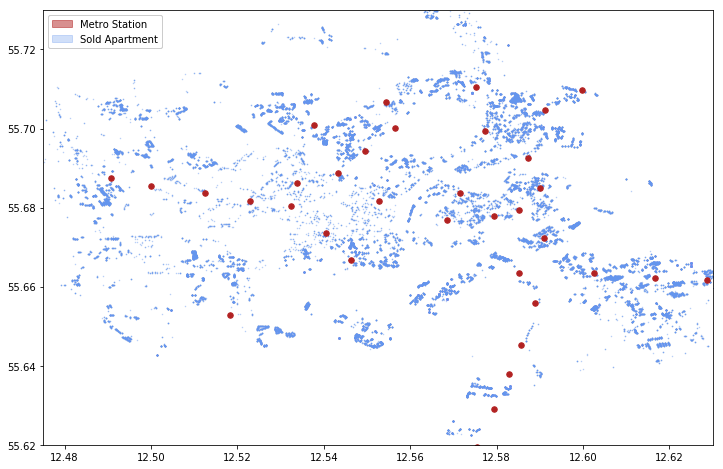

In [28]:
fig, ax1 = plt.subplots(figsize=(12,8), frameon=False)
title_font = {'size':'16', 'color':'black', 'weight':'normal',
              'verticalalignment':'bottom'}

#plt.title('Condos sold in Copenhagen',**title_font)

#Plotting wheat price:
ax1.scatter(x=Apartments['longitude'], y=Apartments['latitude'],c='cornflowerblue',label='Sold Apartment',s=0.2,alpha=0.5)

ax1.scatter(x=MetroList['longitude'], y=MetroList['latitude'], c='firebrick',label='Metro',s=30)
BBox = (12.475, 12.63, 55.62, 55.73)
ax1.set_xlim(BBox[0],BBox[1])
ax1.set_ylim(BBox[2],BBox[3])

# image = plt.imread('/Users/holger/Documents/Python/Harmsen_Repo/Metro-Study/Other data/map2.png')
# ax1.imshow(image, zorder=0, extent = BBox, aspect= 'equal')
plt.tick_params()


blue = mpatches.Patch(color='cornflowerblue', label='Sold Apartment',alpha=0.3)
red = mpatches.Patch(color='firebrick', label='Metro Station',alpha=0.5)

legend1 = plt.legend(handles=[red, blue], loc='upper left', frameon=True, framealpha=1)
ax1.add_artist(legend1)

plt.savefig('/Users/holger/Documents/Python/Harmsen_Repo/Metro-Study/Other data/Condo Map.pdf')


# Only Cityring

In [5]:
Cityring = MetroList[(MetroList['Cityringen']==1)]

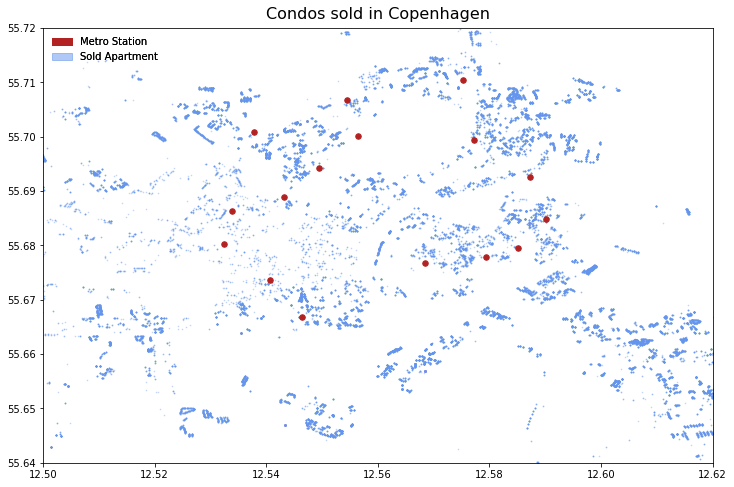

In [10]:
fig, ax1 = plt.subplots(figsize=(12,8), frameon=False)
title_font = {'size':'16', 'color':'black', 'weight':'normal',
              'verticalalignment':'bottom'}

plt.title('Condos sold in Copenhagen',**title_font)

#Plotting wheat price:
ax1.scatter(x=Apartments['longitude'], y=Apartments['latitude'], c='cornflowerblue',label='Sold Apartment',s=0.5,alpha=0.3)
ax1.scatter(x=Cityring['longitude'], y=Cityring['latitude'], c='firebrick',label='Metro',s=30)
BBox = (12.5, 12.62, 55.64, 55.72)
ax1.set_xlim(BBox[0],BBox[1])
ax1.set_ylim(BBox[2],BBox[3])

plt.tick_params()

grey = mpatches.Patch(color='cornflowerblue', label='Sold Apartment',alpha=0.3)
red = mpatches.Patch(color='firebrick', label='Metro Station',alpha=1)

legend1 = plt.legend(handles=[red, grey], loc='upper left', frameon=False)
ax1.add_artist(legend1)



plt.savefig('/Users/holger/Documents/Python/Harmsen_Repo/Metro-Study/Other data/Condo Map.pdf')
